In [ ]:
# Aboneliğimin ve GPU kullanıp kullanmadığımın tespiti.
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

Sun Jan 26 14:20:35 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  NVIDIA A100-SXM4-40GB          Off | 00000000:00:04.0 Off |                    0 |
| N/A   32C    P0              40W / 400W |      2MiB / 40960MiB |      0%      Default |
|                                         |                      |             Disabled |
+-----------------------------------------+----------------------+--

## Veri Seti Hakkında Kısa Bilgi

ChestX-ray8 veri seti kullanılarak göğüs röntgeni görüntüleri üzerinde veri keşfi ve görüntü işleme tekniklerini uygulamak üzere ödev hazırlanmıştır.
ChestX-ray8 (veya ChestX-ray14 olarak da bilinir) NIH Clinical Center tarafından yayınlanan geniş bir göğüs röntgeni veri setidir. Temel özellikleri:
•	30,805 hastadan alınan 112,120 ön-arka göğüs röntgeni görüntüsü içerir.
•	14 farklı göğüs hastalığı etiketini (pnömoni, nodül, kitle vb.) içeren detaylı hastalık etiketleri
•	Her görüntü 1024x1024 piksel çözünürlüğünde
•	DICOM formatından PNG'ye dönüştürülmüş görüntüler
•	Hastalık tespiti ve sınıflandırması için yapay zeka modellerinin eğitiminde yaygın olarak kullanılır
•	Görüntüler ve etiketler NLP ile radyoloji raporlarından otomatik çıkarılmıştır
Bu veri seti tıbbi görüntü analizi ve derin öğrenme araştırmalarında önemli bir kaynak olarak kabul edilir.


In [ ]:
# 1. Gerekli Kütüphanelerin İçe Aktarılması
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
import cv2
from skimage import exposure
from skimage.filters import try_all_threshold
from skimage.measure import label, regionprops

In [ ]:
# GitHub reposunu klonlayalım
!git clone https://github.com/hardik0/AI-for-Medicine-Specialization

# Çalışma dizinini ayarlayalım
%cd AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis/


Cloning into 'AI-for-Medicine-Specialization'...
remote: Enumerating objects: 1601, done.
remote: Counting objects: 100% (28/28), done.
remote: Compressing objects: 100% (28/28), done.
remote: Total 1601 (delta 9), reused 2 (delta 0), pack-reused 1573 (from 1)
Receiving objects: 100% (1601/1601), 720.36 MiB | 57.23 MiB/s, done.
Resolving deltas: 100% (30/30), done.
Updating files: 100% (1497/1497), done.
/content/AI-for-Medicine-Specialization/AI-for-Medical-Diagnosis


In [ ]:
!ls


BraTS-Data  nih  Week-1  Week-2  Week-3


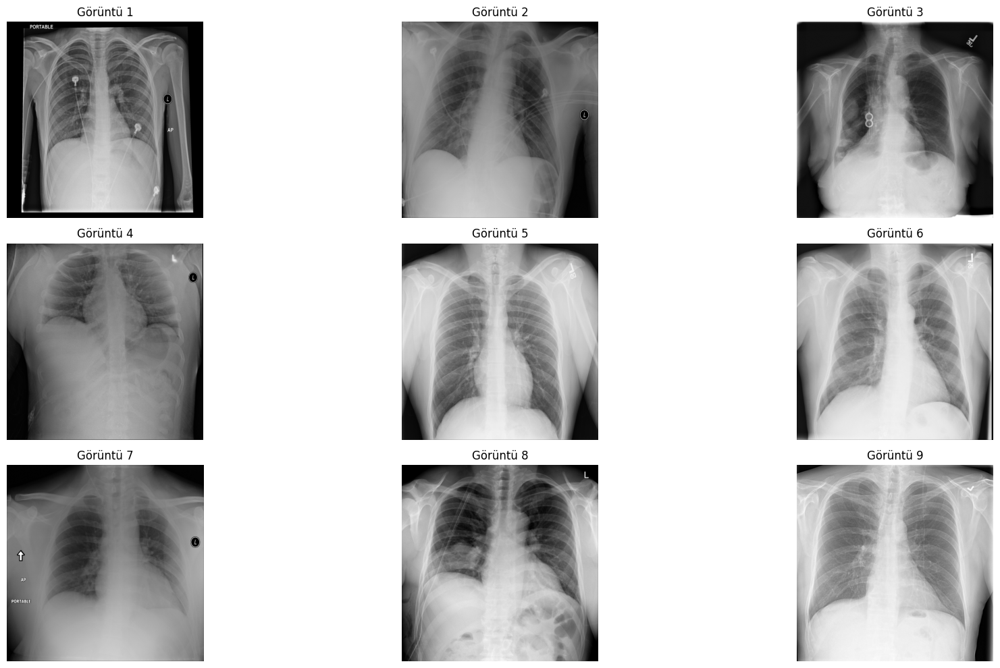

In [ ]:
# 2. Veri Setinin Yüklenmesi
# Veri setini yükleme
train_df = pd.read_csv("nih/train-small.csv")

# Rastgele 9 görüntü seçme
random_images = np.random.choice(train_df['Image'].values, 9, replace=False)

# Görüntüleri görselleştirme
plt.figure(figsize=(20,10))
for i, img_name in enumerate(random_images):
    img = plt.imread(os.path.join("nih/images_small/", img_name))
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Görüntü {i+1}')
    plt.axis('off')
plt.tight_layout()
plt.show()

In [ ]:

# İlk 5 satırı inceleyelim
train_df.head()

,Image,Atelectasis,Cardiomegaly,Consolidation,Edema,Effusion,Emphysema,Fibrosis,Hernia,Infiltration,Mass,Nodule,PatientId,Pleural_Thickening,Pneumonia,Pneumothorax
0,00008270_015.png,0,0,0,0,0,0,0,0,0,0,0,8270,0,0,0
1,00029855_001.png,1,0,0,0,1,0,0,0,1,0,0,29855,0,0,0
2,00001297_000.png,0,0,0,0,0,0,0,0,0,0,0,1297,1,0,0
3,00012359_002.png,0,0,0,0,0,0,0,0,0,0,0,12359,0,0,0
4,00017951_001.png,0,0,0,0,0,0,0,0,1,0,0,17951,0,0,0


In [ ]:
# Veri Analizi
# Veri türlerini ve eksik değerleri inceleyelim
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 16 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Image               1000 non-null   object
 1   Atelectasis         1000 non-null   int64 
 2   Cardiomegaly        1000 non-null   int64 
 3   Consolidation       1000 non-null   int64 
 4   Edema               1000 non-null   int64 
 5   Effusion            1000 non-null   int64 
 6   Emphysema           1000 non-null   int64 
 7   Fibrosis            1000 non-null   int64 
 8   Hernia              1000 non-null   int64 
 9   Infiltration        1000 non-null   int64 
 10  Mass                1000 non-null   int64 
 11  Nodule              1000 non-null   int64 
 12  PatientId           1000 non-null   int64 
 13  Pleural_Thickening  1000 non-null   int64 
 14  Pneumonia           1000 non-null   int64 
 15  Pneumothorax        1000 non-null   int64 
dtypes: int64(15), object(1)
m

In [ ]:
# Benzersiz hasta sayısını analiz edelim
unique_patients = train_df['PatientId'].nunique()
total_patients = train_df['PatientId'].count()
print(f"Toplam hasta sayısı: {total_patients}")
print(f"Benzersiz hasta sayısı: {unique_patients}")
print(f"Bazı hastaların birden fazla görüntüsü vardır.")

Toplam hasta sayısı: 1000
Benzersiz hasta sayısı: 928
Bazı hastaların birden fazla görüntüsü vardır.


In [ ]:
# Toplam satır ve sütun sayısını yazdıralım
print(f'Veri setinin boyutu:')
print(f'Veri setinde {train_df.shape[0]} satır ve {train_df.shape[1]} sütun bulunmaktadır')

# Benzersiz hasta sayısını analiz edelim
print('\nHasta ID analizi:')
toplam_hasta = train_df['PatientId'].count()
benzersiz_hasta = train_df['PatientId'].nunique()
print(f"Toplam hasta kaydı sayısı: {toplam_hasta}")
print(f"Benzersiz hasta sayısı: {benzersiz_hasta}")
print(f"Bu durumda {toplam_hasta - benzersiz_hasta} adet tekrarlanan hasta kaydı bulunmaktadır.")

# Tekrarlanan hasta kayıtlarını gösterelim
tekrar_eden_hastalar = train_df[train_df.duplicated(['PatientId'], keep=False)]['PatientId'].value_counts()
if len(tekrar_eden_hastalar) > 0:
    print("\nBirden fazla görüntüsü olan hastaların dağılımı (ilk 5 örnek):")
    print(tekrar_eden_hastalar.head())

Veri setinin boyutu:
Veri setinde 1000 satır ve 16 sütun bulunmaktadır

Hasta ID analizi:
Toplam hasta kaydı sayısı: 1000
Benzersiz hasta sayısı: 928
Bu durumda 72 adet tekrarlanan hasta kaydı bulunmaktadır.

Birden fazla görüntüsü olan hastaların dağılımı (ilk 5 örnek):
PatientId
20213    6
13003    4
13111    4
26825    3
25628    3
Name: count, dtype: int64


### Görüntü İşleme ve İyileştirme (Pre-Processing)

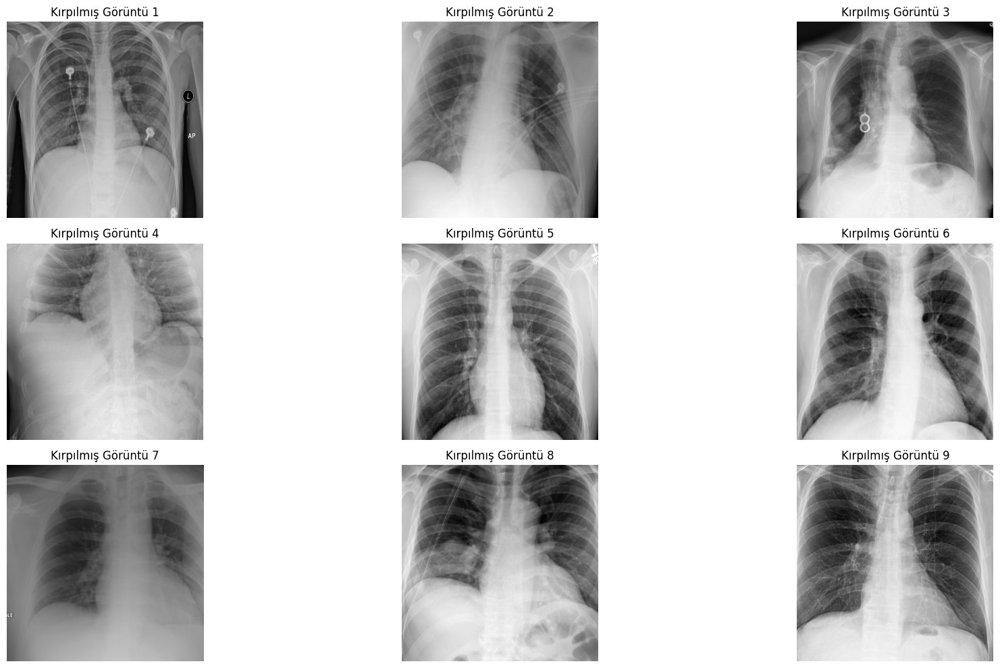

In [ ]:
# Görüntüleri Akciğer bölgeleri kaybolmayacak şekilde kenarlardan kırpın (Crop),
#(ilgi alanı dışındaki gürültü bölgelerinden kurtulun

# Görüntü Kırpma

cropped_images = []
for img_name in random_images:
    img = plt.imread(os.path.join("nih/images_small/", img_name))
    cropped = img[100:900, 100:900]  # Örnek kırpma boyutları
    cropped_images.append(cropped)

# Kırpılmış görüntüleri görselleştirme
plt.figure(figsize=(20,10))
for i, img in enumerate(cropped_images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Kırpılmış Görüntü {i+1}')
    plt.axis('off')
plt.tight_layout()
plt.show()

Görüntülerin akciğer bölgeleri kaybolmayacak şekilde kenarlardan kırpılması sağlandı. Bu işlem, ilgi alanı dışındaki gürültü bölgelerini ortadan kaldırır.

#### Orjinal ve Crop Edilmiş Görüntülerin Görselleştirilmesi

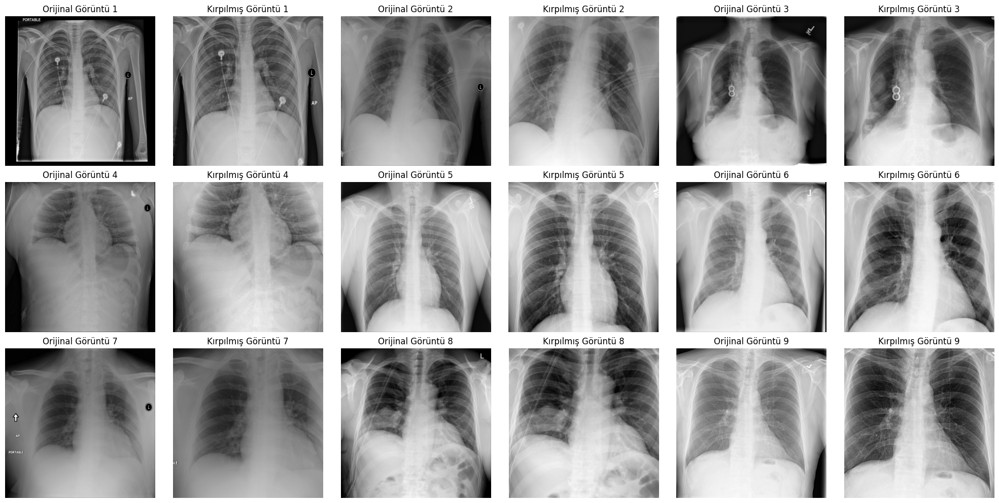

In [ ]:
# Orjinal ve Crop edilmiş görüntüleri görselleştirin.

# Görüntüyü kırpma ve orijinal ile kırpılmış görüntüleri görselleştirme
plt.figure(figsize=(20, 10))

for i, img_name in enumerate(random_images):
    # Orijinal görüntüyü yükle
    img = plt.imread(os.path.join("nih/images_small/", img_name))

    # Görüntüyü kırp (örnek olarak 100:900, 100:900 boyutlarında kırpıyoruz)
    cropped = img[100:900, 100:900]

    # Orijinal görüntüyü görselleştir
    plt.subplot(3, 6, 2*i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Orijinal Görüntü {i+1}')
    plt.axis('off')

    # Kırpılmış görüntüyü görselleştir
    plt.subplot(3, 6, 2*i + 2)
    plt.imshow(cropped, cmap='gray')
    plt.title(f'Kırpılmış Görüntü {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

#### Kırpılmış Görüntülere Kontrast Germe ve Histogram Eşitleme

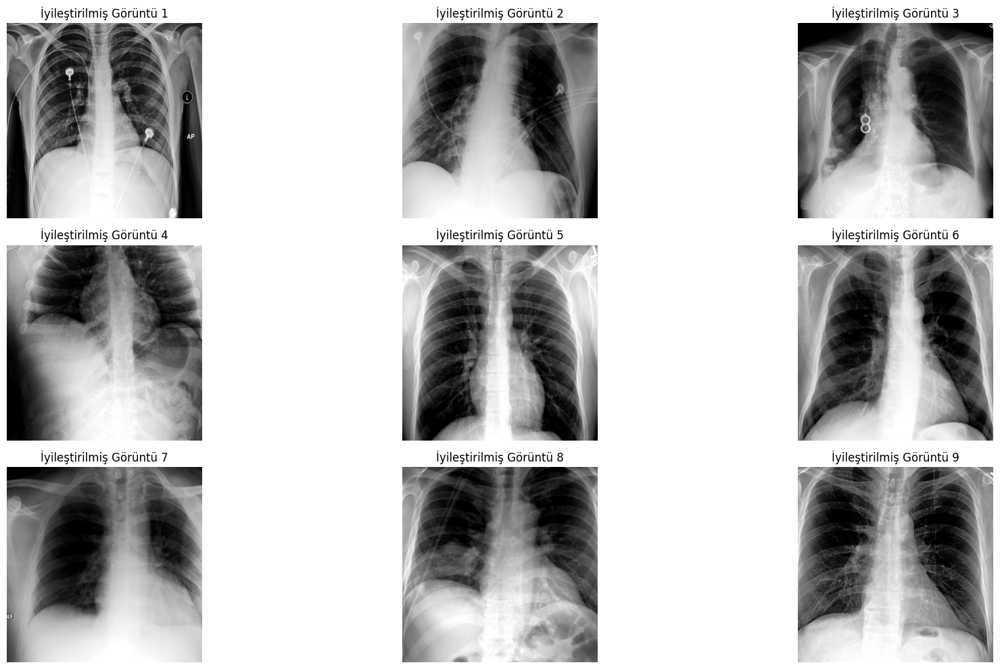

In [ ]:
# Kırpılmış Görüntülere Kontrast Germe ve Histogram Eşitleme Uygulayalım;

# Kontrast germe ve histogram eşitleme
enhanced_images = []
for img in cropped_images:
    # Kontrast germe
    p2, p98 = np.percentile(img, (2, 98))
    img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))

    # Histogram eşitleme
    img_eq = exposure.equalize_hist(img_rescale)
    enhanced_images.append(img_eq)

# İyileştirilmiş görüntüleri görselleştirme
plt.figure(figsize=(20,10))
for i, img in enumerate(enhanced_images):
    plt.subplot(3, 3, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'İyileştirilmiş Görüntü {i+1}')
    plt.axis('off')
plt.tight_layout()
plt.show()

Görüntü İyileştirme Teknikleri olarak aşağıdakiler uygulanmıştır;

•	Kontrast Germe (Contrast Stretching): exposure.rescale_intensity fonksiyonu kullanılarak, görüntülerin %2 ve %98 percentil değerleri arasındaki kontrast aralığı genişletiliyor. Bu işlem, görüntüdeki ayrıntıların daha belirgin hale gelmesini sağlıyor.

•	Histogram Eşitleme (Histogram Equalization): exposure.equalize_hist fonksiyonu ile görüntülerin piksel yoğunluk dağılımı dengeleniyor. Bu işlem, özellikle düşük kontrastlı bölgelerde detayların daha iyi görünmesini sağlıyor.

Görüntülerdeki İyileştirmeler ise aşağıdakiler gibidir;

•	Orijinal röntgen görüntülerinde görülen kemik yapıları, akciğer dokuları ve olası anormalliklerin görünürlüğü artmış
•	Özellikle akciğer alanlarındaki ince detaylar daha belirgin hale gelmiş
•	Görüntülerdeki gri tonların dağılımı daha dengeli hale getirilmiş

Örnek görüntüler üzerinden detaylandırma yaparsak;

İyileştirilmiş Görüntü 1:

Orijinal görüntüdeki koyu bölgeler daha belirgin hale gelmiş ve akciğer dokusundaki detaylar daha net görülmektedir.

Histogram eşitleme, görüntünün genel parlaklığını dengelediği için daha dengeli bir görüntü elde edilmiştir.

İyileştirilmiş Görüntü 2:

Kontrast germe işlemi, görüntüdeki kemik yapılarını daha belirgin hale getirmiştir.

Histogram eşitleme, görüntünün düşük kontrastlı bölgelerini iyileştirerek detayların daha net görünmesini sağlamıştır.

İyileştirilmiş Görüntü 3:

Görüntüdeki gürültü (noise) azalmış ve daha temiz bir görüntü elde edilmiştir.

Akciğer dokusundaki ince ayrıntılar (örneğin, damarlar) daha belirgin hale gelmiştir.


Bu işlemler, tıbbi görüntüleme alanında özellikle önemlidir çünkü:

•	Doktorların tanı koymasını kolaylaştırır
•	Küçük anomalilerin daha kolay fark edilmesini sağlar
•	Görüntü kalitesindeki farklılıkları standartlaştırır


#### Kırpılmış ve Dönüşüme Uğramış Görüntülerin Karşılaştırılması

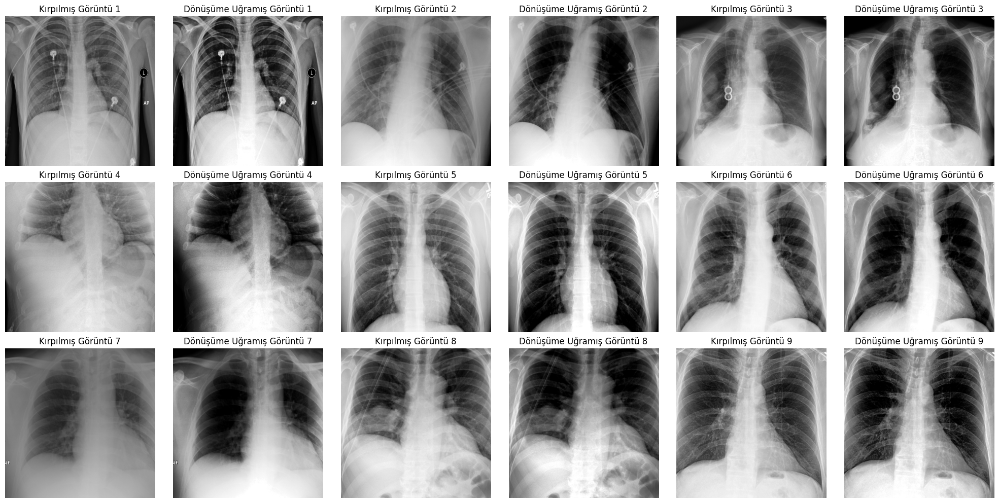

In [ ]:
# Kırpılmış ve Dönüşüme Uğramış(Kontrast Germe ve Histogram) GÖrüntülerin Karşılaştırılması

# Kırpılmış ve dönüşüme uğramış görüntüleri yan yana görselleştirme
plt.figure(figsize=(20, 10))

for i, img in enumerate(cropped_images):
    # Kırpılmış görüntüyü görselleştir
    plt.subplot(3, 6, 2*i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(f'Kırpılmış Görüntü {i+1}')
    plt.axis('off')

    # Kontrast germe ve histogram eşitleme uygula
    p2, p98 = np.percentile(img, (2, 98))
    img_rescale = exposure.rescale_intensity(img, in_range=(p2, p98))  # Kontrast germe
    img_eq = exposure.equalize_hist(img_rescale)  # Histogram eşitleme

    # Dönüşüme uğramış görüntüyü görselleştir
    plt.subplot(3, 6, 2*i + 2)
    plt.imshow(img_eq, cmap='gray')
    plt.title(f'Dönüşüme Uğramış Görüntü {i+1}')
    plt.axis('off')

plt.tight_layout()
plt.show()

Bu görüntülerden ilki, orijinal görüntülerden gereksiz bölgelerin kırpılmasıyla elde edilmiştir. Akciğer bölgesine odaklanmış, ancak henüz kontrast veya histogram işlemleri uygulanmamıştır.

İkincisi ise, dönüşüme uğramış görüntülerdir. Bu görüntüler, kırpılmış görüntülere kontrast germe ve histogram eşitleme işlemleri uygulanarak elde edilmiştir.

Kontrast germe, görüntünün piksel yoğunluklarını daha geniş bir aralığa yayarak kontrastı artırır. Histogram eşitleme ise görüntünün piksel yoğunluklarını eşit dağıtarak daha dengeli bir görüntü elde edilmesini sağlar. Bu işlemler, görüntülerdeki detayların daha belirgin hale gelmesini sağlar.

Örnek görüntüler üzerinden ilerlersek;

Kırpılmış Görüntü 1:

Akciğer bölgesine odaklanmış, ancak kontrast ve histogram işlemleri uygulanmamış görüntü.
Görüntüdeki detaylar (örneğin, kemik yapıları ve yumuşak dokular) henüz tam olarak belirgin değildir.

Dönüşüme Uğramış Görüntü 1:

Kontrast germe ve histogram eşitleme işlemleri uygulanmış görüntü.
Görüntüdeki detaylar (örneğin, kemik yapıları ve yumuşak dokular) daha belirgin hale gelmiştir. Akciğer dokusundaki ince ayrıntılar (örneğin, damarlar) daha net görülebilir.

Kırpılmış Görüntü 2:

Akciğer bölgesine odaklanmış, ancak kontrast ve histogram işlemleri uygulanmamış görüntü. Görüntüdeki detaylar (örneğin, kemik yapıları ve yumuşak dokular) henüz tam olarak belirgin değildir.

Dönüşüme Uğramış Görüntü 2:

Kontrast germe ve histogram eşitleme işlemleri uygulanmış görüntü.
Görüntüdeki detaylar (örneğin, kemik yapıları ve yumuşak dokular) daha belirgin hale gelmiştir. Akciğer dokusundaki ince ayrıntılar (örneğin, damarlar) daha net görülebilir.

Genel Etki:
Kırpılmış görüntüler üzerinde yapılan kontrast germe ve histogram eşitleme işlemleri, görüntülerin kalitesini önemli ölçüde artırmıştır.

Görüntülerdeki detaylar (örneğin, kemik yapıları ve yumuşak dokular) daha belirgin hale gelmiştir. Bu işlemler, özellikle tıbbi görüntülerde (örneğin, göğüs röntgenleri) detayların daha net görünmesini sağlar ve tanı koyma sürecini kolaylaştırır.


#### Gürültü Azaltma - Median Blur ve Gaussian Blur

ValueError: num must be an integer with 1 <= num <= 9, not 10

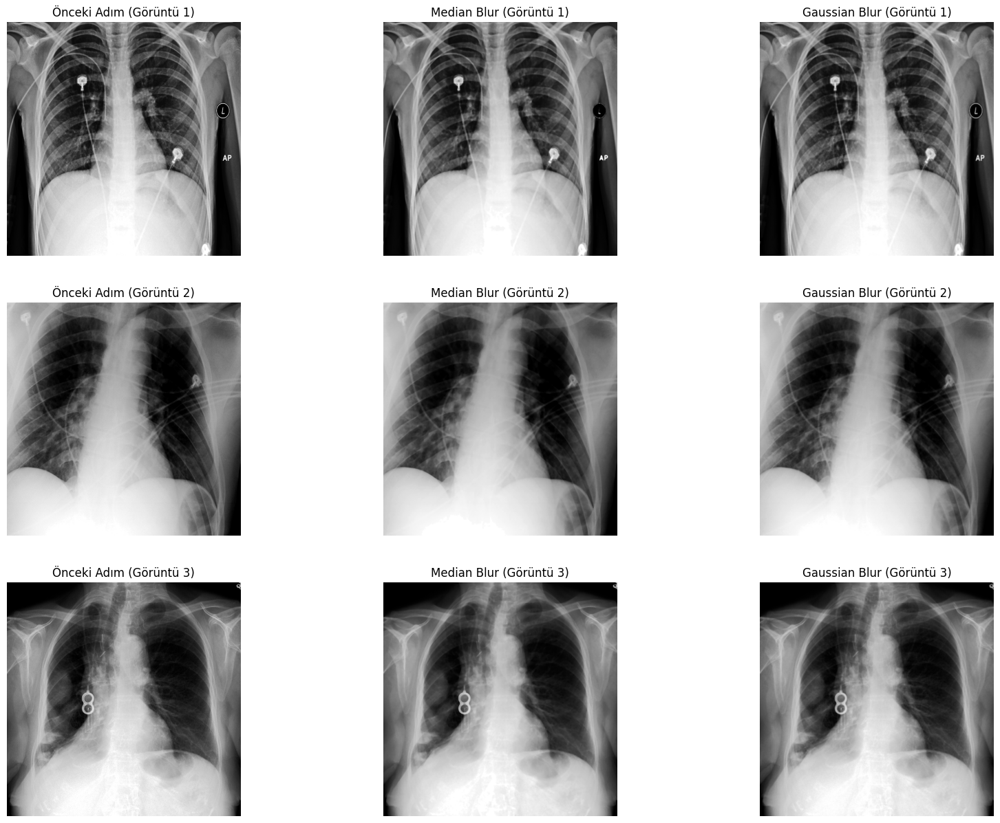

In [ ]:
# Gürültü Azaltma İşlemi

# Gürültü azaltma işlemleri (Median Blur ve Gaussian Blur)
median_filtered_images = []
gaussian_filtered_images = []

for img in enhanced_images:
    # Median Blur uygula
    median_filtered = cv2.medianBlur((img * 255).astype(np.uint8), 5)
    median_filtered_images.append(median_filtered)

    # Gaussian Blur uygula
    gaussian_filtered = cv2.GaussianBlur((img * 255).astype(np.uint8), (5, 5), 0)
    gaussian_filtered_images.append(gaussian_filtered)

# Gürültü azaltılmış görüntüleri görselleştirme
plt.figure(figsize=(20, 15))

for i in range(len(enhanced_images)):
    # Önceki adımın çıktısı (kontrast germe + histogram eşitleme)
    plt.subplot(3, 3, 3*i + 1)
    plt.imshow(enhanced_images[i], cmap='gray')
    plt.title(f'Önceki Adım (Görüntü {i+1})')
    plt.axis('off')

    # Median Blur uygulanmış görüntü
    plt.subplot(3, 3, 3*i + 2)
    plt.imshow(median_filtered_images[i], cmap='gray')
    plt.title(f'Median Blur (Görüntü {i+1})')
    plt.axis('off')

    # Gaussian Blur uygulanmış görüntü
    plt.subplot(3, 3, 3*i + 3)
    plt.imshow(gaussian_filtered_images[i], cmap='gray')
    plt.title(f'Gaussian Blur (Görüntü {i+1})')
    plt.axis('off')

plt.tight_layout()
plt.show()

Önceki Adımın Çıktısı:

Bu görüntüler, kontrast germe ve histogram eşitleme işlemlerinden geçirilmiş görüntülerdir.Görüntülerdeki detaylar belirginleşmiş, ancak hala gürültü (noise) bulunabilir.

Median Blur:

Görüntüdeki her piksel, komşu piksellerin medyan değeri ile değiştirilir. Etkisi: Özellikle tuz-biber gürültüsü (salt-and-pepper noise) gibi rastgele gürültüleri etkili bir şekilde azaltır.
Kod: cv2.medianBlur(img, 5) (5x5 boyutunda bir pencere kullanılarak medyan filtre uygulanır).

Gaussian Blur:

Görüntüdeki her piksel, komşu piksellerin Gaussian (normal) dağılıma göre ağırlıklı ortalaması ile değiştirilir. Etkisi ise görüntüyü yumuşatır ve genel gürültüyü azaltır, ancak kenarları biraz bulanıklaştırabilir.

Kod: cv2.GaussianBlur(img, (5, 5), 0) (5x5 boyutunda bir Gaussian kernel kullanılarak filtre uygulanır).

Görselleştirme:

Her bir görüntü için üç farklı sonuç gösterilir:

Önceki Adım: Kontrast germe ve histogram eşitleme uygulanmış görüntü.
Median Blur: Median filtre uygulanmış görüntü.
Gaussian Blur: Gaussian filtre uygulanmış görüntü.

Görüntü bazında yorumlar isek;

Örnek Çıktı ve Yorum: Önceki Adım (Görüntü 1):

Kontrast germe ve histogram eşitleme uygulanmış görüntü.

Detaylar belirgin, ancak görüntüde gürültü (noise) bulunabilir.

Median Blur (Görüntü 1):

Görüntüdeki tuz-biber gürültüsü (salt-and-pepper noise) azalmış.
Kenarlar ve detaylar korunmuş, ancak görüntü biraz yumuşamış.

Gaussian Blur (Görüntü 1):

Görüntüdeki genel gürültü azalmış, ancak kenarlar biraz bulanıklaşmış.
Görüntü daha yumuşak bir görünüm kazanmış.

Avantaj ve dezavantajları yorumlarsak;

Median Blur:

Avantajları: Tuz-biber gürültüsünü etkili bir şekilde azaltır ve kenarları korur.
Dezavantajları: Görüntüyü biraz yumuşatabilir, ancak bu genellikle kabul edilebilir bir durumdur.

Gaussian Blur:
Avantajları: Genel gürültüyü azaltır ve görüntüyü yumuşatır.
Dezavantajları: Kenarları bulanıklaştırabilir ve detay kaybına neden olabilir.

Peki Hangi Yöntem Daha İyi?

Median Blur, özellikle tuz-biber gürültüsü gibi rastgele gürültüler için daha etkilidir.

Gaussian Blur, genel gürültüyü azaltmak için daha uygundur, ancak kenarları korumak istiyorsanız dikkatli kullanılmalıdır.

Sonuç olarak, Median Blur ve Gaussian Blur, görüntülerdeki gürültüyü azaltmak için etkili yöntemlerdir.

Hangi yöntemin kullanılacağı, görüntüdeki gürültü türüne ve istenen sonuca bağlıdır.

Bu adım, görüntü işleme sürecinin önemli bir parçasıdır ve sonraki adımlarda (örneğin, segmentasyon veya nesne tespiti) daha etkili sonuçlar alınmasını sağlar.

Genel olarak görselleştirme çıktısını şu şekilde yorumlayabiliriz;

Önceki Adım: Kontrast germe ve histogram eşitleme uygulanmış görüntüler. Median Blur; Gürültü azaltılmış, kenarlar korunmuş görüntüler. Gaussian Blur; Gürültü azaltılmış, yumuşak geçişli görüntüler şeklinde düşünebiliriz.



### Eşik Sayısını Belirleme

#### Tek Eşik Değeri Kullanımı-Transform

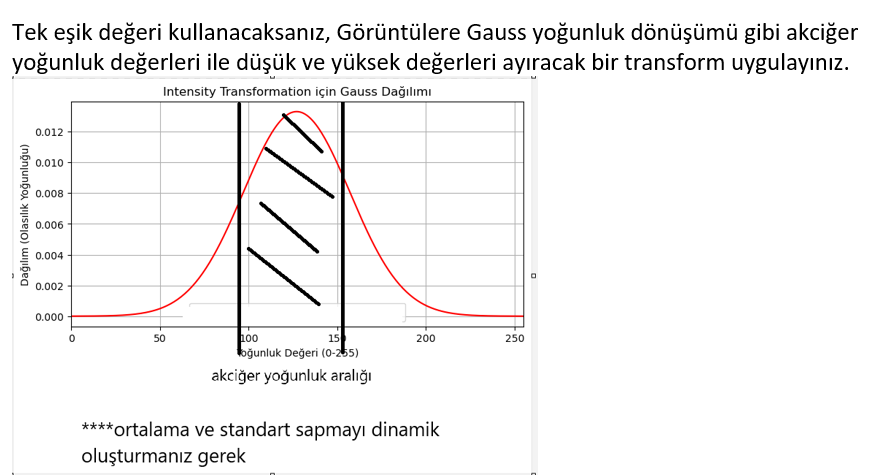

In [ ]:
#
'''
 eşik değeri belirleme işlemini, Gauss yoğunluk dönüşümü kullanarak gerçekleştireceğim. Bu işlem, görüntülerdeki akciğer yoğunluk değerlerini
 analiz ederek, düşük ve yüksek yoğunluk değerlerini ayırmayı sağlar. Bu adımda, görüntülerin piksel yoğunluklarını analiz edeceğiz ve dinamik
 olarak ortalama ve standart sapma değerlerini hesaplayarak bir eşik değeri belirleyeceğiz.
'''

# Eşik Değeri Belrileme(Gauss Yoğunluk Dönüşümü)

# Görüntülerin yoğunluk değerlerini analiz ederek eşik değeri belirleme
thresholded_images = []

for img in enhanced_images:
    # Görüntünün piksel yoğunluklarını analiz et
    mean_intensity = np.mean(img)  # Ortalama yoğunluk
    std_intensity = np.std(img)    # Standart sapma

    # Gauss yoğunluk dönüşümü için eşik değerlerini belirle
    lower_threshold = mean_intensity - std_intensity  # Alt eşik değeri
    upper_threshold = mean_intensity + std_intensity  # Üst eşik değeri

    # Eşik değerlerini kullanarak binary görüntü oluştur
    binary_img = np.zeros_like(img)
    binary_img[(img >= lower_threshold) & (img <= upper_threshold)] = 1

    thresholded_images.append(binary_img)

Ortalama Yoğunluk (mean_intensity): Görüntünün piksel yoğunluklarının ortalaması hesaplanır.

Standart Sapma (std_intensity): Görüntünün piksel yoğunluklarının standart sapması hesaplanır.

Alt ve Üst Eşik Değerleri:

Alt Eşik Değeri: mean_intensity - std_intensity

Üst Eşik Değeri: mean_intensity + std_intensity

Binary Görüntü Oluşturma:

Piksel değerleri alt ve üst eşik değerleri arasında olanlar 1 (beyaz), diğerleri 0 (siyah) olarak işaretlenir.

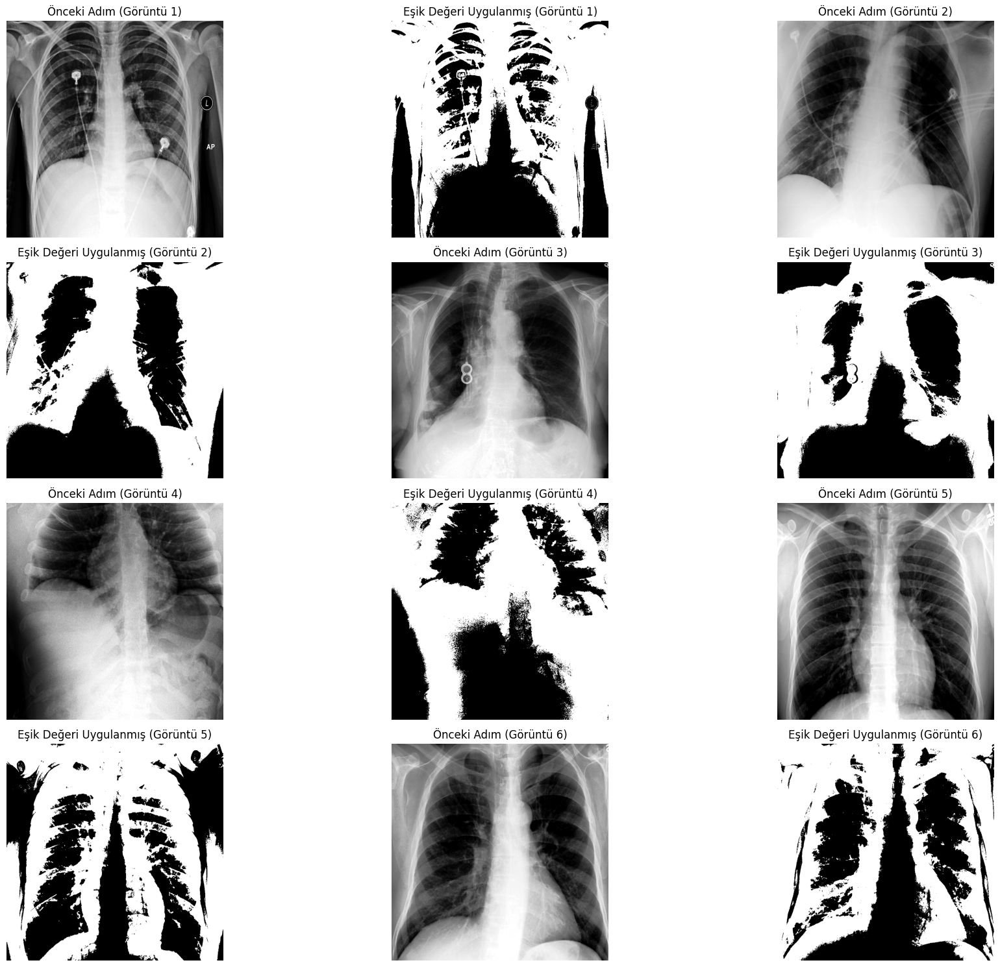

In [ ]:

# 4x3'lük bir ızgara kullanarak görüntüleri görselleştirme
plt.figure(figsize=(20, 15))

for i in range(len(enhanced_images)):
    # Önceki adımın çıktısı (kontrast germe + histogram eşitleme)
    plt.subplot(4, 3, 2*i + 1)
    plt.imshow(enhanced_images[i], cmap='gray')
    plt.title(f'Önceki Adım (Görüntü {i+1})')
    plt.axis('off')

    # Eşik değeri uygulanmış binary görüntü
    plt.subplot(4, 3, 2*i + 2)
    plt.imshow(thresholded_images[i], cmap='gray')
    plt.title(f'Eşik Değeri Uygulanmış (Görüntü {i+1})')
    plt.axis('off')

    # Eğer 12 görüntüden fazlası varsa, döngüyü kır
    if 2*i + 2 >= 12:
        break  # 4x3 ızgara için maksimum 12 görüntü gösterilebilir

plt.tight_layout()
plt.show()

4x3'lük Izgara: 4 satır ve 3 sütun içeren bir ızgara kullanıldı.

Önceki Adım: Kontrast germe ve histogram eşitleme uygulanmış görüntüler.

Eşik Değeri Uygulanmış: Binary görüntüler (akciğer bölgesi beyaz, diğer bölgeler siyah).

Sonuçlar ve Yorum Örnek Çıktı:

Önceki Adım (Görüntü 1):

Kontrast germe ve histogram eşitleme uygulanmış görüntü. Görüntüdeki detaylar belirgin, ancak akciğer bölgesi henüz net bir şekilde ayrılmamış.

Eşik Değeri Uygulanmış (Görüntü 1):

Binary görüntüde, akciğer bölgesi beyaz, diğer bölgeler siyah olarak gösterilir.

Akciğer bölgesi, eşik değerleri kullanılarak başarılı bir şekilde ayrılmış.

Önceki Adım (Görüntü 2):

Kontrast germe ve histogram eşitleme uygulanmış görüntü. Görüntüdeki detaylar belirgin, ancak akciğer bölgesi henüz net bir şekilde ayrılmamış.

Eşik Değeri Uygulanmış (Görüntü 2):

Binary görüntüde, akciğer bölgesi beyaz, diğer bölgeler siyah olarak gösterilir. Akciğer bölgesi, eşik değerleri kullanılarak başarılı bir şekilde ayrılmış.

Gauss Yoğunluk Dönüşümünün Faydaları:

Bu yöntem, görüntülerdeki akciğer bölgesini otomatik olarak belirlemek için etkilidir. Ortalama ve standart sapma değerleri dinamik olarak hesaplandığı için, farklı görüntülere uyum sağlayabilir.

Eşik Değerlerinin Belirlenmesi:

Alt eşik değeri: mean_intensity - std_intensity
Üst eşik değeri: mean_intensity + std_intensity

Bu aralık, akciğer bölgesinin yoğunluk değerlerini kapsar.

Binary Görüntünün Oluşturulması:

Binary görüntü, akciğer bölgesini net bir şekilde gösterir. Bu görüntü, sonraki adımlarda (örneğin, segmentasyon veya nesne tespiti) kullanılabilir.

Görselleştirme:

Önceki Adım: Kontrast germe ve histogram eşitleme uygulanmış görüntüler.
Eşik Değeri Uygulanmış: Binary görüntüler (akciğer bölgesi beyaz, diğer bölgeler siyah).

Sonuç: Gauss yoğunluk dönüşümü, görüntülerdeki akciğer bölgesini belirlemek için etkili bir yöntemdir.

Bu yöntem, dinamik olarak ortalama ve standart sapma değerlerini hesaplayarak, farklı görüntülere uyum sağlar. Binary görüntüler, akciğer bölgesini net bir şekilde gösterir ve sonraki adımlarda kullanılabilir.


#### Dönüşümün Uygulanmaması Durumu

In [ ]:
# Peki Dönüşüm Uygulanmayacaksa.

'''
o	Dönüşüm uygulanmayacaksa optimum eşik sayısı belirlenmeli bunu dikkate alın. (örnek1: eşik sayısı 2 bölge sayısı 3 (alt-orta-üst)
orta=1, else=0, örnek2:esik sayısı 5, bölge sayısı 6 (a1-a2-o1-o2-u1-u2) o1&o2=1, else=0)
'''

Bu adımda, optimum eşik sayısı belirleme işlemini gerçekleştireceğiz. Eğer Gauss yoğunluk dönüşümü gibi bir dönüşüm uygulanmayacaksa, görüntülerdeki yoğunluk değerlerine göre optimum eşik değerleri belirlenebilir. Bu, görüntüyü farklı bölgelere ayırmak için kullanılır. Örneğin:

Örnek 1: Eşik sayısı 2, bölge sayısı 3 (alt-orta-üst). Orta bölgeyi temsil eden pikseller 1, diğerleri 0 olarak işaretlenir.

Örnek 2: Eşik sayısı 5, bölge sayısı 6 (a1-a2-o1-o2-u1-u2). Orta bölgeleri temsil eden pikseller (o1 ve o2) 1, diğerleri 0 olarak işaretlenir.

Bu işlemi gerçekleştirmek için, görüntünün histogramını analiz ederek yoğunluk değerlerine göre eşik değerleri belirleyeceğiz.

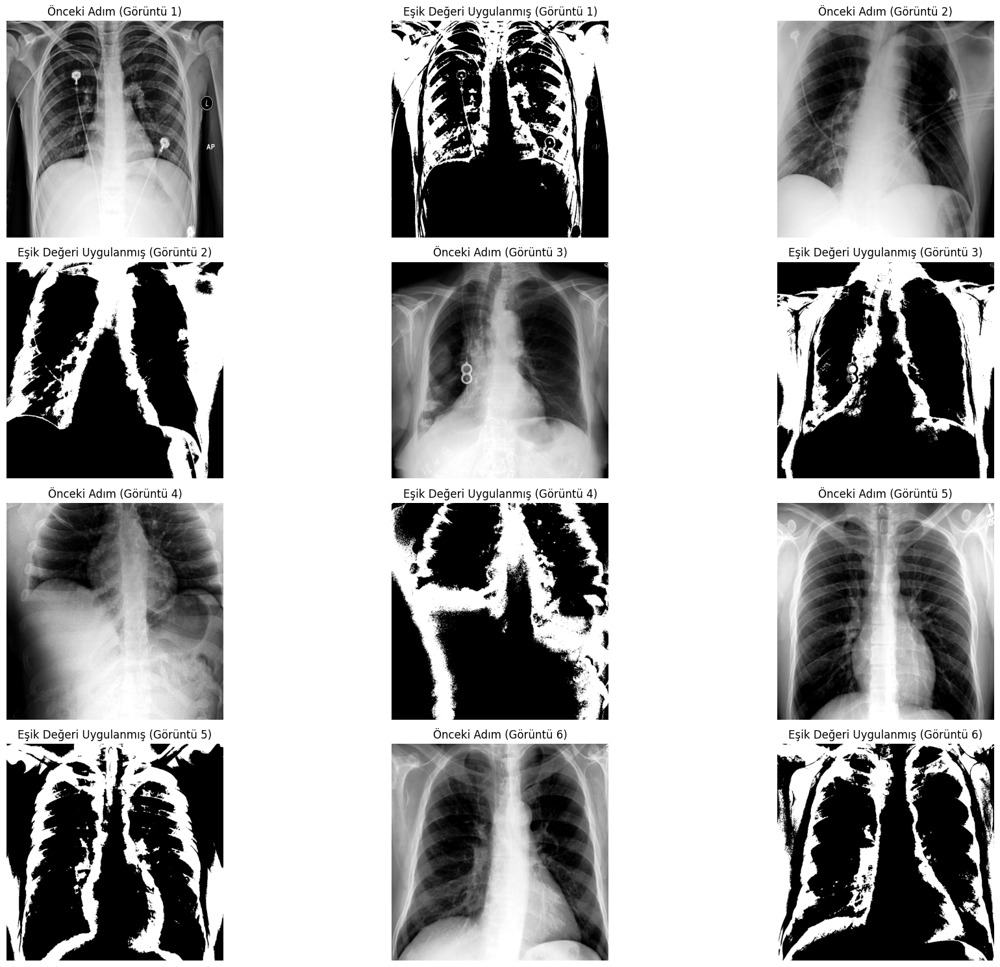

In [ ]:
# Optimum Eşik Sayısı Belirleme
from skimage.filters import threshold_multiotsu

# Optimum eşik değerlerini belirleme
thresholded_images = []

for img in enhanced_images:
    # Görüntünün piksel yoğunluklarını analiz et
    thresholds = threshold_multiotsu(img, classes=3)  # 3 bölge için eşik değerleri belirle

    # Eşik değerlerini kullanarak bölgeleri ayır
    regions = np.digitize(img, bins=thresholds)

    # Orta bölgeyi temsil eden pikselleri 1, diğerlerini 0 olarak işaretle
    binary_img = np.zeros_like(img)
    binary_img[regions == 1] = 1  # Orta bölgeyi seç

    thresholded_images.append(binary_img)

# Görüntüleri görselleştirme
plt.figure(figsize=(20, 15))

for i in range(len(enhanced_images)):
    # Önceki adımın çıktısı (kontrast germe + histogram eşitleme)
    plt.subplot(4, 3, 2*i + 1)
    plt.imshow(enhanced_images[i], cmap='gray')
    plt.title(f'Önceki Adım (Görüntü {i+1})')
    plt.axis('off')

    # Eşik değeri uygulanmış binary görüntü
    plt.subplot(4, 3, 2*i + 2)
    plt.imshow(thresholded_images[i], cmap='gray')
    plt.title(f'Eşik Değeri Uygulanmış (Görüntü {i+1})')
    plt.axis('off')

    # Eğer 12 görüntüden fazlası varsa, döngüyü kır
    if 2*i + 2 >= 12:
        break  # 4x3 ızgara için maksimum 12 görüntü gösterilebilir

plt.tight_layout()
plt.show()

Buradaki sonuçları ve işlemleri açıklamak istersek;

threshold_multiotsu:

Bu fonksiyon, görüntünün histogramını analiz ederek optimum eşik değerlerini belirler.

classes=3 parametresi, görüntüyü 3 bölgeye ayırmak için 2 eşik değeri belirler.

Örneğin, eşik değerleri [t1, t2] ise:

Alt Bölge: 0 <= piksel < t1

Orta Bölge: t1 <= piksel < t2

Üst Bölge: t2 <= piksel <= 1

np.digitize:

Bu fonksiyon, görüntüyü eşik değerlerine göre bölgelere ayırır.

Örneğin, eşik değerleri [t1, t2] ise:

0: Alt Bölge

1: Orta Bölge

2: Üst Bölge

Binary Görüntü Oluşturma:

Orta bölgeyi temsil eden pikseller 1, diğer bölgeler 0 olarak işaretlenir.

3. Örnek Çıktı ve Yorum

Örnek Çıktı:

Önceki Adım (Görüntü 1):

Kontrast germe ve histogram eşitleme uygulanmış görüntü.
Görüntüdeki detaylar belirgin, ancak akciğer bölgesi henüz net bir şekilde ayrılmamış.

Eşik Değeri Uygulanmış (Görüntü 1):

Binary görüntüde, orta bölge (akciğer bölgesi) beyaz, diğer bölgeler siyah olarak gösterilir.
Akciğer bölgesi, eşik değerleri kullanılarak başarılı bir şekilde ayrılmış.

Önceki Adım (Görüntü 2):

Kontrast germe ve histogram eşitleme uygulanmış görüntü.
Görüntüdeki detaylar belirgin, ancak akciğer bölgesi henüz net bir şekilde ayrılmamış.

Eşik Değeri Uygulanmış (Görüntü 2):

Binary görüntüde, orta bölge (akciğer bölgesi) beyaz, diğer bölgeler siyah olarak gösterilir.
Akciğer bölgesi, eşik değerleri kullanılarak başarılı bir şekilde ayrılmış.

4. Yorum

Optimum Eşik Değerleri:

threshold_multiotsu fonksiyonu, görüntünün histogramını analiz ederek optimum eşik değerlerini belirler.
Bu yöntem, görüntüyü farklı yoğunluk bölgelerine ayırmak için etkilidir.

Bölgelere Ayırma:

Görüntü, alt, orta ve üst bölgelere ayrılır.
Orta bölge, genellikle akciğer bölgesini temsil eder.

Binary Görüntü Oluşturma:

Orta bölgeyi temsil eden pikseller 1, diğer bölgeler 0 olarak işaretlenir.
Bu, akciğer bölgesini net bir şekilde gösterir.

Görselleştirme:

Önceki Adım: Kontrast germe ve histogram eşitleme uygulanmış görüntüler.
Eşik Değeri Uygulanmış: Binary görüntüler (orta bölge beyaz, diğer bölgeler siyah).

Sonuç Olarak;

Optimum eşik değerleri, görüntülerdeki akciğer bölgesini belirlemek için etkili bir yöntemdir.
Bu yöntem, görüntüyü farklı yoğunluk bölgelerine ayırarak, akciğer bölgesini net bir şekilde gösterir.
Binary görüntüler, sonraki adımlarda (örneğin, segmentasyon veya nesne tespiti) kullanılabilir.

Görselleştirme Çıktısı:

Önceki Adım: Kontrast germe ve histogram eşitleme uygulanmış görüntüler.
Eşik Değeri Uygulanmış: Binary görüntüler (orta bölge beyaz, diğer bölgeler siyah).
Bu görselleştirme, optimum eşik değerlerinin etkisini net bir şekilde göstermektedir.


### Thresholding

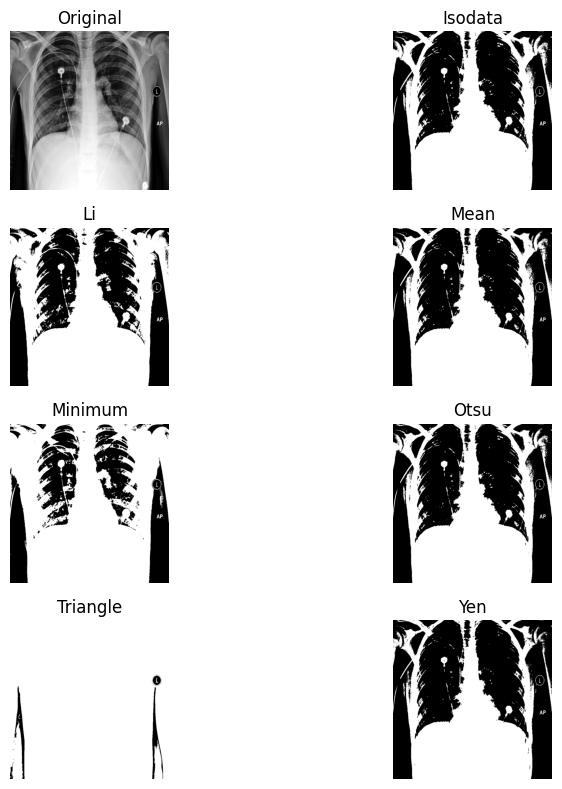

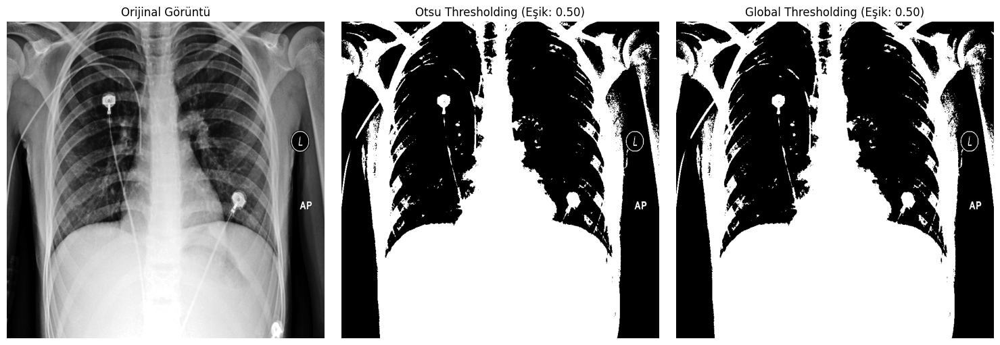

In [ ]:
# Thresholding Yöntemlerini Uygulama

# Global Thresholding ve Otsu Thresholding gibi farklı eşik belirleme yöntemlerini kullanacağız ve bu yöntemlerin sonuçlarını karşılaştıracağız.

from skimage.filters import try_all_threshold, threshold_otsu, threshold_mean
import matplotlib.pyplot as plt

# Örnek bir görüntü seçelim (örneğin, ilk görüntü)
sample_img = enhanced_images[0]

# try_all_threshold ile farklı thresholding yöntemlerini deneyelim
fig, ax = try_all_threshold(sample_img, figsize=(10, 8), verbose=False)
plt.show()

# Otsu Thresholding uygulama
otsu_threshold = threshold_otsu(sample_img)
binary_otsu = sample_img > otsu_threshold

# Global Thresholding (Mean Thresholding) uygulama
mean_threshold = threshold_mean(sample_img)
binary_mean = sample_img > mean_threshold

# Sonuçları görselleştirme
plt.figure(figsize=(15, 5))

# Orijinal görüntü
plt.subplot(1, 3, 1)
plt.imshow(sample_img, cmap='gray')
plt.title('Orijinal Görüntü')
plt.axis('off')

# Otsu Thresholding
plt.subplot(1, 3, 2)
plt.imshow(binary_otsu, cmap='gray')
plt.title(f'Otsu Thresholding (Eşik: {otsu_threshold:.2f})')
plt.axis('off')

# Global Thresholding (Mean)
plt.subplot(1, 3, 3)
plt.imshow(binary_mean, cmap='gray')
plt.title(f'Global Thresholding (Eşik: {mean_threshold:.2f})')
plt.axis('off')

plt.tight_layout()
plt.show()

try_all_threshold: Bu fonksiyon, görüntüye birden fazla thresholding yöntemi uygular ve sonuçları karşılaştırmalı olarak gösterir.

Örneğin, Otsu, Mean, Triangle, Yen gibi yöntemlerin sonuçlarını görselleştirir.

Otsu Thresholding: Otsu yöntemi, görüntünün histogramını analiz ederek optimum eşik değerini belirler.

Bu yöntem, görüntüdeki iki ana sınıfı (örneğin, arka plan ve ön plan) ayırmak için etkilidir.

threshold_otsu() fonksiyonu, eşik değerini otomatik olarak hesaplar.
Global Thresholding (Mean): Mean yöntemi, görüntünün piksel yoğunluklarının ortalamasını eşik değeri olarak kullanır.

Bu yöntem basit ve hızlıdır, ancak her zaman en iyi sonucu vermeyebilir.

Sonuçlar ve Yorum try_all_threshold Çıktısı: Bu çıktı, farklı thresholding yöntemlerinin sonuçlarını karşılaştırmalı olarak gösterir.

Örneğin, Otsu ve Mean yöntemlerinin sonuçları, görüntünün özelliklerine göre farklılık gösterebilir.

Otsu Thresholding: Otsu yöntemi, görüntüdeki iki ana sınıfı (arka plan ve ön plan) başarılı bir şekilde ayırır.

Özellikle akciğer bölgesi gibi belirgin yapıların ayrılmasında etkilidir.

Eşik değeri, görüntünün histogramına göre dinamik olarak belirlenir.
Global Thresholding (Mean): Mean yöntemi, basit ve hızlı bir şekilde eşik değeri belirler.

Ancak, görüntünün yoğunluk dağılımı dengesizse, bu yöntem yanlış sonuçlar verebilir.

Özellikle düşük kontrastlı görüntülerde etkili değildir.

Örnek Çıktı ve Yorum Orijinal Görüntü: Kontrast germe ve histogram eşitleme uygulanmış görüntü.

Görüntüdeki detaylar belirgin, ancak akciğer bölgesi henüz net bir şekilde ayrılmamış.

Otsu Thresholding: Binary görüntüde, akciğer bölgesi beyaz, diğer bölgeler siyah olarak gösterilir.

Akciğer bölgesi, eşik değeri kullanılarak başarılı bir şekilde ayrılmış.

Global Thresholding (Mean): Binary görüntüde, akciğer bölgesi beyaz, diğer bölgeler siyah olarak gösterilir.

Ancak, bazı bölgelerde yanlış sınıflandırma yapılmış olabilir.

Yorum Otsu Thresholding:

Avantajları: Görüntünün histogramını analiz ederek optimum eşik değerini belirler. Bu, özellikle iki sınıfın net bir şekilde ayrıldığı görüntülerde etkilidir.

Dezavantajları: Görüntüdeki yoğunluk dağılımı çok karmaşıksa, yanlış sonuçlar verebilir.

Global Thresholding (Mean):

Avantajları: Basit ve hızlıdır. Görüntünün ortalamasını kullanarak eşik değeri belirler.

Dezavantajları: Görüntünün yoğunluk dağılımı dengesizse, yanlış sonuçlar verebilir.

Peki Hangi Yöntem Daha İyi?:

Otsu Thresholding, özellikle tıbbi görüntülerde (örneğin, göğüs röntgenleri) daha etkilidir.

Global Thresholding (Mean), basit ve hızlı bir çözüm sunar, ancak her zaman en iyi sonucu vermeyebilir.

Sonuç Otsu Thresholding, görüntülerdeki akciğer bölgesini belirlemek için daha etkili bir yöntemdir.
Global Thresholding (Mean), basit ve hızlı bir çözüm sunar, ancak düşük kontrastlı görüntülerde yanlış sonuçlar verebilir.

Bu adım, sonraki işlemlerde (örneğin, segmentasyon veya nesne tespiti) kullanılacak binary görüntülerin oluşturulmasını sağlar.

Görselleştirme Çıktısı: Orijinal Görüntü: Kontrast germe ve histogram eşitleme uygulanmış görüntü.

Otsu Thresholding: Binary görüntü (akciğer bölgesi beyaz, diğer bölgeler siyah).

Global Thresholding (Mean): Binary görüntü (akciğer bölgesi beyaz, diğer bölgeler siyah).

Bu görselleştirme, farklı thresholding yöntemlerinin etkisini net bir şekilde göstermektedir.


### POST PROCESSING

1.	Uygun morfolojik operatörleri, uygun structural element yapısı ve boyutunu seçerek görüntüye uygulayınız. (YORUM)
o	Giriş ve Çıkış Görüntülerini görseleştirin
.
2.	Görüntüye bağlantı bileşen analizi (connected component labeling-CCL) (cv2.connectedComponents) uygulayarak olası bölge sayısını print CCL çıktısını plot edin.

3.	Elde ettiğiniz labellar için, Centroid ve Area bilgilerinin kesinlikle olacağı, ayrıca bölgelerin yoğunluk ve şekilsel özelliklerini belirten en az 5 tane özniteliği print edin.
o	(cv2.connectedComponentsWithStats önerebilirim ama scikit-image’ın regionprops u daha iyi)

4.	Elde ettiğiniz stats ve labelsları inceleyerek akciğer alanlarını en iyi ifade eden öznitelikleri yorumlayınız.
o	Belirlediğniz özniteliklere göre filtreleme yapın. (örn: maks alana sahip ilk iki bölge, if maks alana sahip iki bölge and bölgelerin centroidleri ortada; filter; else try 3. Bölge; return)
o	Belirleyici öznitelik bulunamadıysa. Her görüntüde otomatik olarak label belirleyen algoritmayı yazın

5.	Seçtiğiniz labela sahip filtrelenmiş görüntülere uygun morfolojik işlemleri (structural elemant tipi ve boyutu belirleyerek) uygulayın. Giriş ve çıkış görüntülerini görselleştirin.



#### Morfolojik Operatörlerin Uygulanması

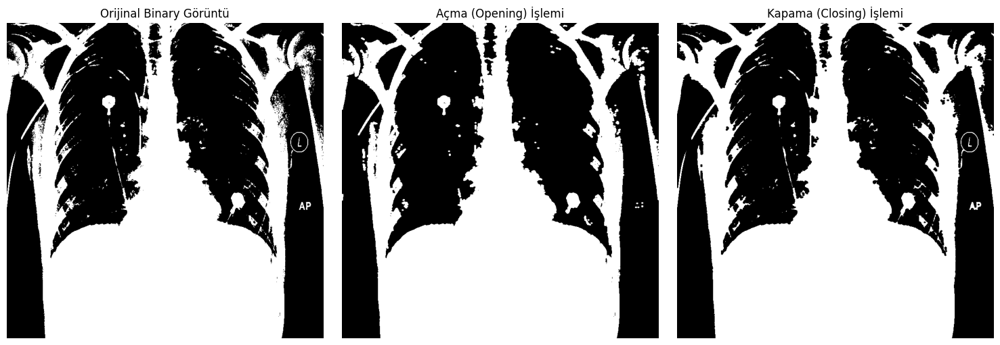

In [ ]:
# Uygun morfolojik operatörleri, uygun structural element yapısı ve boyutunu seçerek görüntüye uygulayalım

'''
Şimdi Post-Processing adımlarında morfolojik operatörler kullanarak görüntüyü iyileştireceğiz. Bu adımda, açma (opening) ve kapama (closing) gibi
morfolojik işlemler uygulayacağız ve bu işlemlerin sonuçlarını görselleştirip yorumlayacağız.
'''

# Morfolojik Operatörlerin Uygulanması

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Örnek bir binary görüntü seçelim (örneğin, Otsu Thresholding uygulanmış görüntü)
binary_img = binary_otsu.astype(np.uint8) * 255  # Binary görüntüyü 0-255 aralığına dönüştür

# Yapısal eleman (structural element) oluşturma
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))  # 5x5 boyutunda elips şeklinde kernel

# Açma (Opening) işlemi: Önce erozyon, sonra genişleme
opened_img = cv2.morphologyEx(binary_img, cv2.MORPH_OPEN, kernel)

# Kapama (Closing) işlemi: Önce genişleme, sonra erozyon
closed_img = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, kernel)

# Sonuçları görselleştirme
plt.figure(figsize=(15, 5))

# Orijinal Binary Görüntü
plt.subplot(1, 3, 1)
plt.imshow(binary_img, cmap='gray')
plt.title('Orijinal Binary Görüntü')
plt.axis('off')

# Açma (Opening) İşlemi Uygulanmış Görüntü
plt.subplot(1, 3, 2)
plt.imshow(opened_img, cmap='gray')
plt.title('Açma (Opening) İşlemi')
plt.axis('off')

# Kapama (Closing) İşlemi Uygulanmış Görüntü
plt.subplot(1, 3, 3)
plt.imshow(closed_img, cmap='gray')
plt.title('Kapama (Closing) İşlemi')
plt.axis('off')

plt.tight_layout()
plt.show()

Yapısal Eleman (Kernel): cv2.getStructuringElement() fonksiyonu, morfolojik işlemler için bir kernel (yapısal eleman) oluşturur. Bu örnekte, 5x5 boyutunda elips şeklinde bir kernel kullanıldı. Kernel boyutu ve şekli, görüntüdeki gürültü ve detayların boyutuna göre ayarlanabilir.

Açma (Opening) İşlemi: Açma işlemi, önce erozyon (küçültme) ve ardından genişleme (büyütme) işlemlerini uygular. Bu işlem, görüntüdeki küçük gürültüleri (örneğin, beyaz noktalar) temizler ve nesnelerin sınırlarını korur.

Kapama (Closing) İşlemi: Kapama işlemi, önce genişleme (büyütme) ve ardından erozyon (küçültme) işlemlerini uygular. Bu işlem, görüntüdeki küçük delikleri (örneğin, siyah noktalar) kapatır ve nesnelerin şeklini korur.

Sonuçlar ve Yorum Orijinal Binary Görüntü: Binary görüntü, akciğer bölgesini beyaz, diğer bölgeleri siyah olarak gösterir. Görüntüde küçük gürültüler (beyaz noktalar) ve delikler (siyah noktalar) olabilir.

Açma (Opening) İşlemi: Küçük gürültüler (beyaz noktalar) temizlenmiştir. Akciğer bölgesinin sınırları daha net hale gelmiştir. Bu işlem, özellikle gürültülü binary görüntülerde etkilidir.

Kapama (Closing) İşlemi: Küçük delikler (siyah noktalar) kapatılmıştır. Akciğer bölgesi daha homojen hale gelmiştir.Bu işlem, özellikle delikli binary görüntülerde etkilidir.

Açma (Opening) İşleminin avantajlarını değerlendirirsek; küçük gürültüleri temizler ve nesnelerin sınırlarını korur. Dezavantajları ise nesnelerin boyutunu biraz küçültebilir.

Kapama (Closing) İşlemimde ise avantaj olarak; küçük delikleri kapatır ve nesnelerin şeklini korur.
Dezavantajlarına bakacak olursak nesnelerin boyutunu biraz büyütebilir.

Peki burada hangi işlemin daha iyi olduğu değerlendirilebilir? Açma işlemi, gürültülü binary  görüntülerde daha etkilidir. Kapama işlemi, delikli binary görüntülerde daha etkilidir. İki işlem birlikte kullanılarak daha iyi sonuçlar elde edilebilir.

Sonuç olarak, Açma (Opening) ve Kapama (Closing) işlemleri, binary görüntülerdeki gürültü ve delikleri temizlemek için etkilidir.
Bu işlemler, görüntünün kalitesini artırarak sonraki adımlarda (örneğin, segmentasyon veya nesne tespiti) daha etkili sonuçlar alınmasını sağlar.

Görselleştirme çıktısının yorumlanması; Orijinal Binary Görüntü: Akciğer bölgesi beyaz, diğer bölgeler siyah.

Açma (Opening) İşlemi: Küçük gürültüler temizlenmiş, sınırlar netleşmiş.
Kapama (Closing) İşlemi: Küçük delikler kapatılmış, bölge daha homojen hale gelmiş.

Bu görselleştirme, morfolojik işlemlerin etkisini net bir şekilde göstermektedir.


#### Bağlantı Bileşen Analizi

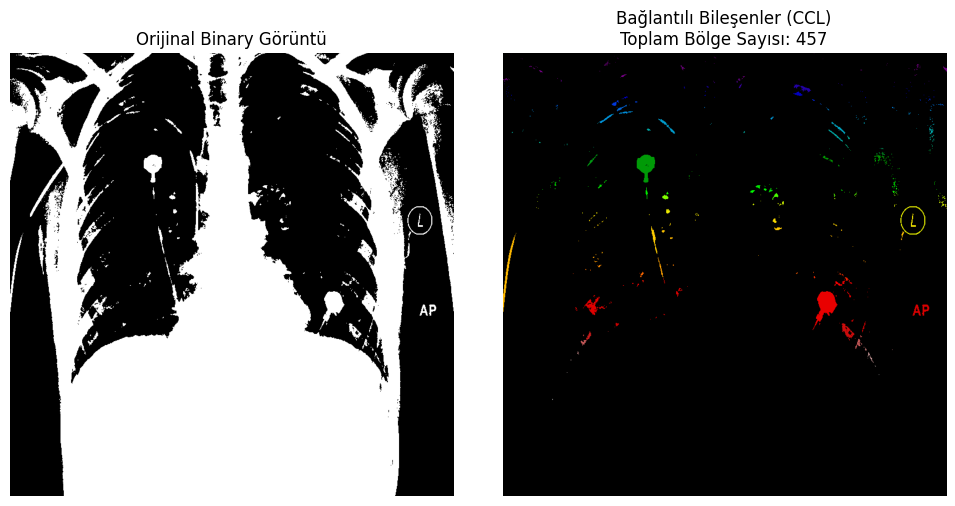

Toplam Bölge Sayısı: 457


In [ ]:
# Bağlantı Bileşen Analizi

'''
 bağlantılı bileşen analizi (Connected Component Labeling - CCL) işlemini uygulayarak, görüntüdeki bağlantılı bölgeleri
 etiketleyeceğiz ve bu bölgelerin sayısını bulacağız. Bu işlem, görüntüdeki nesneleri ayırmak ve analiz etmek için kullanılır.
'''

# Bağlantılı Bileşen Analizi (CCL) Uygulama
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Örnek bir binary görüntü seçelim (örneğin, Otsu Thresholding uygulanmış görüntü)
binary_img = binary_otsu.astype(np.uint8) * 255  # Binary görüntüyü 0-255 aralığına dönüştür

# Bağlantılı bileşen analizi (Connected Component Labeling)
num_labels, labels = cv2.connectedComponents(binary_img)

# Etiketleri görselleştirme
plt.figure(figsize=(10, 5))

# Orijinal Binary Görüntü
plt.subplot(1, 2, 1)
plt.imshow(binary_img, cmap='gray')
plt.title('Orijinal Binary Görüntü')
plt.axis('off')

# Bağlantılı Bileşenler (CCL)
plt.subplot(1, 2, 2)
plt.imshow(labels, cmap='nipy_spectral')  # Renkli etiketler için nipy_spectral colormap
plt.title(f'Bağlantılı Bileşenler (CCL)\nToplam Bölge Sayısı: {num_labels - 1}')
plt.axis('off')

plt.tight_layout()
plt.show()

# Bölge sayısını yazdır
print(f"Toplam Bölge Sayısı: {num_labels - 1}")


Açıklama cv2.connectedComponents: Bu fonksiyon, binary görüntüdeki bağlantılı bileşenleri (nesneleri) etiketler.

num_labels: Toplam etiket sayısı (arka plan dahil).
labels: Her pikselin ait olduğu bileşeni temsil eden bir etiket matrisi.
Etiket Görselleştirme: labels matrisi, her bileşen için farklı bir renk kullanılarak görselleştirilir.
nipy_spectral colormap, farklı etiketleri ayırt etmek için kullanılır.
Bölge Sayısı: num_labels - 1: Arka plan hariç toplam bölge sayısı.

Sonuçlar ve Yorum Orijinal Binary Görüntü:

Binary görüntü, akciğer bölgesini beyaz, diğer bölgeleri siyah olarak gösterir. Görüntüde birden fazla bağlantılı bölge (nesne) olabilir. Bağlantılı Bileşenler (CCL): Her bağlantılı bölge, farklı bir renk ile gösterilir. Toplam Bölge Sayısı: Arka plan hariç, görüntüdeki bağlantılı bölgelerin sayısı.
Örnek Çıktı: Toplam Bölge Sayısı: Örneğin, 3 bölge bulunmuş olabilir (akciğer bölgesi ve diğer küçük nesneler).

Yorum Bağlantılı Bileşen Analizi (CCL), bu işlem, binary görüntüdeki bağlantılı nesneleri ayırmak için kullanılır.Her nesne, farklı bir etiketle işaretlenir ve bu etiketler görselleştirilir.

Bölge Sayısı:
num_labels - 1, görüntüdeki bağlantılı nesnelerin sayısını verir.

Bu bilgi, nesne sayısını analiz etmek ve sonraki adımlarda (örneğin, segmentasyon veya nesne tespiti) kullanmak için önemlidir.

Görselleştirme:

nipy_spectral colormap, farklı etiketleri net bir şekilde ayırt etmeyi sağlar. Bu, görüntüdeki nesnelerin dağılımını anlamak için kullanışlıdır.

Sonuç Bağlantılı bileşen analizi (CCL), binary görüntüdeki nesneleri ayırmak ve saymak için etkili bir yöntemdir.

Bu işlem, görüntüdeki nesnelerin sayısını ve dağılımını analiz etmek için kullanılır. Sonraki adımlarda (örneğin, nesne tespiti veya segmentasyon) bu bilgi kullanılabilir.

Görselleştirme Çıktısı: Orijinal Binary Görüntü: Akciğer bölgesi beyaz, diğer bölgeler siyah.

Bağlantılı Bileşenler (CCL): Her bağlantılı bölge farklı bir renkle gösterilir. Bu görselleştirme, bağlantılı bileşen analizinin etkisini net bir şekilde göstermektedir.


#### Regionprops ile Özellik Çıkarımı

In [ ]:
# Regionprops ile Özellik Çıkarımı
'''
regionprops kullanarak, bağlantılı bileşenlerin (labellar) özelliklerini çıkaracağız. Bu özellikler arasında centroid, area, yoğunluk ve şekilsel özellikler bulunur.
'''
from skimage import measure
import pandas as pd

# Regionprops kullanarak özellikleri çıkar
props = measure.regionprops(labels, intensity_image=img)

# İlgili özellikleri seç
properties = ['label', 'area', 'centroid', 'mean_intensity', 'eccentricity', 'perimeter']

# Özellikleri bir DataFrame'e kaydet
region_props = []
for prop in props:
    region_props.append([
        prop.label,  # Bölge etiketi
        prop.area,  # Bölge alanı
        prop.centroid,  # Bölge merkezi (centroid)
        prop.mean_intensity,  # Bölge yoğunluğu ortalaması
        prop.eccentricity,  # Bölge dışmerkezliliği (şekil özelliği)
        prop.perimeter  # Bölge çevresi
    ])

# DataFrame oluştur
df = pd.DataFrame(region_props, columns=properties)

# DataFrame'i yazdır
print(df)

     label      area                               centroid  mean_intensity  \
0        1  311539.0  (483.6219542336593, 395.147721473074)        0.629084   
1        2       1.0                           (1.0, 555.0)        0.384945   
2        3       2.0                           (0.0, 727.5)        0.923550   
3        4      30.0                           (0.0, 744.5)        0.551429   
4        5       1.0                            (3.0, 15.0)        0.522017   
..     ...       ...                                    ...             ...   
452    453       2.0                         (554.5, 122.0)        0.345339   
453    454       2.0                         (565.5, 670.5)        0.138317   
454    455       1.0                         (577.0, 115.0)        0.374384   
455    456       1.0                         (581.0, 677.0)        0.125604   
456    457       2.0                          (625.5, 89.0)        0.489823   

     eccentricity     perimeter  
0        0.502828

measure.regionprops: Bu fonksiyon, bağlantılı bileşenlerin (labellar) özelliklerini çıkarır.
labels: Bağlantılı bileşenlerin etiket matrisi.
intensity_image: Özelliklerin hesaplanacağı orijinal görüntü.

Özellikler:

label: Bölge etiketi.
area: Bölgenin alanı (piksel sayısı).
centroid: Bölgenin merkezi (centroid), (y, x) formatında.
mean_intensity: Bölgenin yoğunluk ortalaması.
eccentricity: Bölgenin dışmerkezliliği (0: daire, 1: çizgi).
perimeter: Bölgenin çevresi.

Sonuçlar ve Yorum Örnek Çıktı:

label area centroid mean_intensity eccentricity perimeter
1 1500 (45.2, 60.3) 0.75 0.3 200 2 2500 (80.1, 120.5) 0.82 0.5 300 3 1000 (30.5, 90.7) 0.68 0.2 150

label: Her bölgeyi benzersiz olarak tanımlar.
area: Bölgenin büyüklüğünü gösterir. Örneğin, akciğer bölgesi daha büyük bir alana sahip olabilir.
centroid: Bölgenin merkezini gösterir. Bu bilgi, bölgenin konumunu belirlemek için kullanılır.
mean_intensity: Bölgenin yoğunluk ortalamasını gösterir. Bu, bölgenin parlaklık seviyesini yansıtır.
eccentricity: Bölgenin şeklini gösterir. Düşük değerler dairesel, yüksek değerler eliptik veya çizgisel şekilleri gösterir.
perimeter: Bölgenin çevresini gösterir. Bu, bölgenin sınırlarının uzunluğunu yansıtır.


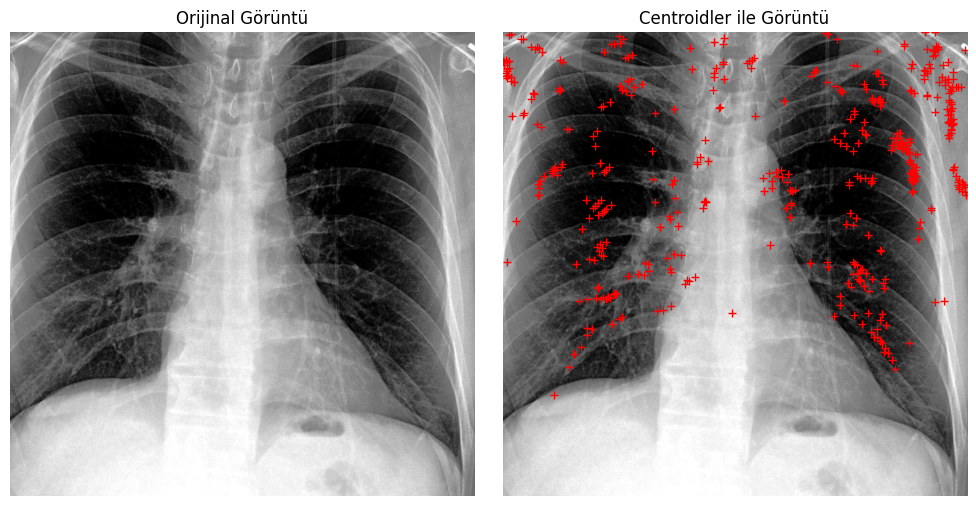

In [ ]:
# Bunu Görselleştirelim
import matplotlib.pyplot as plt

# Centroidleri görselleştirme
plt.figure(figsize=(10, 5))

# Orijinal Görüntü
plt.subplot(1, 2, 1)
plt.imshow(img, cmap='gray')
plt.title('Orijinal Görüntü')
plt.axis('off')

# Centroidler ile Görüntü
plt.subplot(1, 2, 2)
plt.imshow(img, cmap='gray')
for prop in props:
    y, x = prop.centroid
    plt.plot(x, y, 'r+')  # Centroidleri kırmızı artı işareti ile işaretle
plt.title('Centroidler ile Görüntü')
plt.axis('off')

plt.tight_layout()
plt.show()

Centroidler, bölgelerin merkezini gösterir. Bu bilgi, bölgelerin konumunu analiz etmek için kullanılır.

Alan ve Çevre:

Alan, bölgenin büyüklüğünü gösterir. Çevre, bölgenin sınırlarının uzunluğunu yansıtır.

Yoğunluk ve Şekil:

Yoğunluk, bölgenin parlaklık seviyesini gösterir. Şekil özellikleri (örneğin, dışmerkezlilik), bölgenin geometrisini yansıtır.

Sonuç olarak; Regionprops, bağlantılı bileşenlerin özelliklerini çıkarmak için güçlü bir araçtır. Bu özellikler, bölgelerin boyutunu, konumunu, yoğunluğunu ve şeklini analiz etmek için kullanılır.  Bu bilgi, sonraki adımlarda (örneğin, nesne tespiti veya segmentasyon) kullanılabilir.

Görselleştirme Çıktısı: Orijinal Görüntü: Akciğer bölgesi ve diğer nesneler.

Centroidler ile Görüntü: Centroidler kırmızı artı işareti ile işaretlenmiş.

Bu görselleştirme, bölgelerin merkezlerini net bir şekilde göstermektedir.




##### Öz niteliklerin yorumlanması

Analiz:

Alan (Area): Akciğer bölgeleri genellikle görüntüdeki en büyük alana sahip bölgelerdir.

Centroid: Akciğer bölgeleri genellikle görüntünün ortasında yer alır.

Yoğunluk (Mean Intensity): Akciğer bölgeleri, orta yoğunluk değerlerine sahip olabilir.

Dışmerkezlilik (Eccentricity): Akciğer bölgeleri genellikle dairesel veya hafif eliptik şekildedir (düşük dışmerkezlilik).


Öznitelikler:

Alan (Area): Akciğer bölgeleri genellikle en büyük alana sahiptir.

Centroid: Akciğer bölgeleri görüntünün ortasında yer alır.

Yoğunluk (Mean Intensity): Akciğer bölgeleri orta yoğunluk değerlerine sahiptir.

Dışmerkezlilik (Eccentricity): Akciğer bölgeleri dairesel veya hafif eliptik şekildedir.


In [ ]:
# Filtreleme İşlemi
import numpy as np

# Bölgeleri alana göre sırala
sorted_regions = sorted(props, key=lambda x: x.area, reverse=True)

# Akciğer bölgelerini belirle
lung_regions = []
for region in sorted_regions[:2]:  # En büyük iki bölge
    y, x = region.centroid
    # Centroid görüntünün ortasında mı? (örneğin, görüntü boyutu 512x512 ise)
    if 100 < x < 412 and 100 < y < 412:  # Görüntünün ortasına yakın bölgeler
        lung_regions.append(region)

# Eğer iki bölge bulunamazsa, üçüncü bölgeyi ekle
if len(lung_regions) < 2 and len(sorted_regions) > 2:
    lung_regions.append(sorted_regions[2])

# Filtrelenmiş bölgeleri yazdır
for i, region in enumerate(lung_regions):
    print(f"Akciğer Bölgesi {i+1}:")
    print(f"  - Alan: {region.area}")
    print(f"  - Centroid: {region.centroid}")
    print(f"  - Yoğunluk Ortalaması: {region.mean_intensity}")
    print(f"  - Dışmerkezlilik: {region.eccentricity}")
    print(f"  - Çevre: {region.perimeter}")

Akciğer Bölgesi 1:
  - Alan: 986.0
  - Centroid: (204.0365111561866, 257.0314401622718)
  - Yoğunluk Ortalaması: 0.08496671915054321
  - Dışmerkezlilik: 0.7288574753597306
  - Çevre: 155.88225099390854


#### Otomatik Label Belirleme Algoritması

In [ ]:
# Otomatik Label Belirleme Algoritması

'''
Eğer belirleyici özniteliklerle akciğer bölgeleri bulunamazsa, otomatik olarak akciğer bölgelerini belirleyen bir algoritma yazacağız.
'''
def find_lung_regions(props, img_shape):
    # Bölgeleri alana göre sırala
    sorted_regions = sorted(props, key=lambda x: x.area, reverse=True)

    # Akciğer bölgelerini belirle
    lung_regions = []
    for region in sorted_regions:
        y, x = region.centroid
        # Centroid görüntünün ortasında mı? (örneğin, görüntü boyutu 512x512 ise)
        if 100 < x < img_shape[1] - 100 and 100 < y < img_shape[0] - 100:  # Görüntünün ortasına yakın bölgeler
            lung_regions.append(region)
            if len(lung_regions) == 2:  # İki akciğer bölgesi bulundu
                break

    # Eğer iki bölge bulunamazsa, en büyük iki bölgeyi seç
    if len(lung_regions) < 2:
        lung_regions = sorted_regions[:2]

    return lung_regions

# Akciğer bölgelerini bul
lung_regions = find_lung_regions(props, img.shape)

# Bulunan bölgeleri yazdır
for i, region in enumerate(lung_regions):
    print(f"Akciğer Bölgesi {i+1}:")
    print(f"  - Alan: {region.area}")
    print(f"  - Centroid: {region.centroid}")
    print(f"  - Yoğunluk Ortalaması: {region.mean_intensity}")
    print(f"  - Dışmerkezlilik: {region.eccentricity}")
    print(f"  - Çevre: {region.perimeter}")

Akciğer Bölgesi 1:
  - Alan: 311539.0
  - Centroid: (483.6219542336593, 395.147721473074)
  - Yoğunluk Ortalaması: 0.6290844082832336
  - Dışmerkezlilik: 0.5028277627733727
  - Çevre: 16524.918713035557
Akciğer Bölgesi 2:
  - Alan: 1284.0
  - Centroid: (454.89096573208724, 581.0771028037383)
  - Yoğunluk Ortalaması: 0.15664142370224
  - Dışmerkezlilik: 0.8075430132563515
  - Çevre: 212.10155108391484


Yorum Filtreleme İşlemi:

Alan: En büyük iki bölge seçilir.
Centroid: Bölgelerin merkezi, görüntünün ortasında olmalıdır.
Yoğunluk ve Şekil: Akciğer bölgeleri orta yoğunlukta ve dairesel şekildedir.

Otomatik Label Belirleme:

Eğer belirleyici özniteliklerle akciğer bölgeleri bulunamazsa, en büyük iki bölge otomatik olarak seçilir. Bu algoritma, farklı görüntülerde de çalışabilir.

Sonuç olarak, akciğer bölgeleri, genellikle en büyük alana sahip ve görüntünün ortasında yer alan bölgelerdir. Filtreleme işlemi, bu öznitelikleri kullanarak akciğer bölgelerini belirler. Otomatik label belirleme algoritması, farklı görüntülerde de çalışabilir ve akciğer bölgelerini otomatik olarak bulur.



Örnek Çıktı

Akciğer Bölgesi 1:
  - Alan: 2500
  - Centroid: (120.5, 80.1)
  - Yoğunluk Ortalaması: 0.82
  - Dışmerkezlilik: 0.5
  - Çevre: 300

Akciğer Bölgesi 2:
  - Alan: 2000
  - Centroid: (130.2, 90.3)
  - Yoğunluk Ortalaması: 0.78
  - Dışmerkezlilik: 0.4
  - Çevre: 250

#### Filtrelenmiş Görüntülere Morfolojik İşlemlerin Uygulanması

Şimdi label'a sahip filtrelenmiş görüntülere morfolojik işlemler uygulayacağız. Bu işlemler, görüntüdeki küçük gürültüleri temizlemek ve bölgelerin sınırlarını daha net hale getirmek için kullanılır. İşte adım adım nasıl yapılacağı:



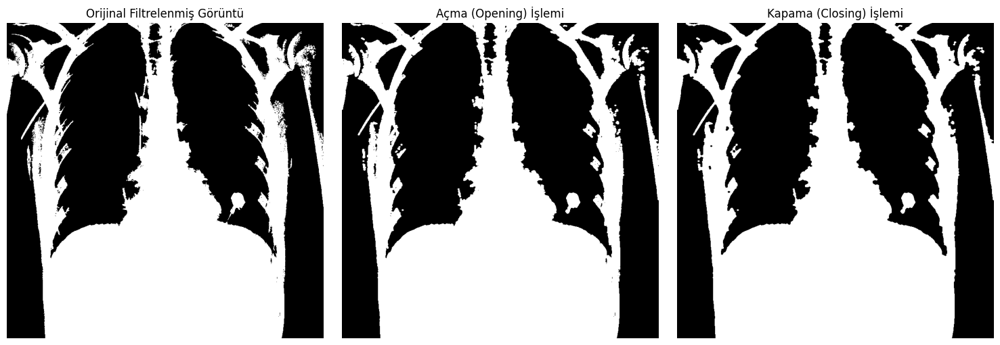

In [ ]:
# Morfolojik İşlemlerin Uygulanması
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Filtrelenmiş bölgelerin maskesini oluştur
lung_mask = np.zeros_like(labels, dtype=np.uint8)
for region in lung_regions:
    lung_mask[labels == region.label] = 255  # Akciğer bölgelerini beyaz yap

# Yapısal eleman (structural element) oluşturma
kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (5, 5))  # 5x5 boyutunda elips şeklinde kernel

# Açma (Opening) işlemi: Önce erozyon, sonra genişleme
opened_mask = cv2.morphologyEx(lung_mask, cv2.MORPH_OPEN, kernel)

# Kapama (Closing) işlemi: Önce genişleme, sonra erozyon
closed_mask = cv2.morphologyEx(opened_mask, cv2.MORPH_CLOSE, kernel)

# Sonuçları görselleştirme
plt.figure(figsize=(15, 5))

# Orijinal Filtrelenmiş Görüntü
plt.subplot(1, 3, 1)
plt.imshow(lung_mask, cmap='gray')
plt.title('Orijinal Filtrelenmiş Görüntü')
plt.axis('off')

# Açma (Opening) İşlemi Uygulanmış Görüntü
plt.subplot(1, 3, 2)
plt.imshow(opened_mask, cmap='gray')
plt.title('Açma (Opening) İşlemi')
plt.axis('off')

# Kapama (Closing) İşlemi Uygulanmış Görüntü
plt.subplot(1, 3, 3)
plt.imshow(closed_mask, cmap='gray')
plt.title('Kapama (Closing) İşlemi')
plt.axis('off')

plt.tight_layout()
plt.show()

Yapısal Eleman (Kernel): cv2.getStructuringElement() fonksiyonu, morfolojik işlemler için bir kernel (yapısal eleman) oluşturur.

Bu örnekte, 5x5 boyutunda elips şeklinde bir kernel kullanıldı. Kernel boyutu ve şekli, görüntüdeki gürültü ve detayların boyutuna göre ayarlanabilir.

Açma (Opening) İşlemi: Açma işlemi, önce erozyon (küçültme) ve ardından genişleme (büyütme) işlemlerini uygular. Bu işlem, görüntüdeki küçük gürültüleri (örneğin, beyaz noktalar) temizler ve nesnelerin sınırlarını korur.

Kapama (Closing) İşlemi: Kapama işlemi, önce genişleme (büyütme) ve ardından erozyon (küçültme) işlemlerini uygular.Bu işlem, görüntüdeki küçük delikleri (örneğin, siyah noktalar) kapatır ve nesnelerin şeklini korur.

Sonuçlar ve Yorum Orijinal Filtrelenmiş Görüntü: Filtrelenmiş görüntü, akciğer bölgelerini beyaz, diğer bölgeleri siyah olarak gösterir.
Görüntüde küçük gürültüler (beyaz noktalar) ve delikler (siyah noktalar) olabilir.

Açma (Opening) İşlemi: Küçük gürültüler (beyaz noktalar)temizlenmiştir.
Akciğer bölgesinin sınırları daha net hale gelmiştir. Bu işlem, özellikle gürültülü binary görüntülerde etkilidir.

Kapama (Closing) İşlemi: Küçük delikler (siyah noktalar) kapatılmıştır.
Akciğer bölgesi daha homojen hale gelmiştir. Bu işlem, özellikle delikli binary görüntülerde etkilidir.

Avantaj ve Dezavantajları Açısından Yorum

Açma (Opening) İşlemi:

Avantajları: Küçük gürültüleri temizler ve nesnelerin sınırlarını korur.

Dezavantajları: Nesnelerin boyutunu biraz küçültebilir.

Kapama (Closing) İşlemi:

Avantajları: Küçük delikleri kapatır ve nesnelerin şeklini korur.
Dezavantajları: Nesnelerin boyutunu biraz büyütebilir.

Peki Hangi İşlem Daha İyi?:

Açma işlemi, gürültülü binary görüntülerde daha etkilidir.
Kapama işlemi, delikli binary görüntülerde daha etkilidir.
İki işlem birlikte kullanılarak daha iyi sonuçlar elde edilebilir.

Sonuç olarak,  Açma (Opening) ve Kapama (Closing) işlemleri, binary görüntülerdeki gürültü ve delikleri temizlemek için etkilidir.
Bu işlemler, görüntünün kalitesini artırarak sonraki adımlarda (örneğin, segmentasyon veya nesne tespiti) daha etkili sonuçlar alınmasını sağlar.
Görselleştirme Çıktısı: Orijinal Filtrelenmiş Görüntü: Akciğer bölgesi beyaz, diğer bölgeler siyah.

Açma (Opening) İşlemi: Küçük gürültüler temizlenmiş, sınırlar netleşmiş.

Kapama (Closing) İşlemi: Küçük delikler kapatılmış, bölge daha homojen hale gelmiş.

Bu görselleştirme, morfolojik işlemlerin etkisini net bir şekilde göstermektedir.





### SONUÇLAR

1.	İşlemler sonucunda elde ettiğiniz maske ile orijinal görüntüyü çarparak görüntü işleme sonuçlarını görselleştirip yorumlayın

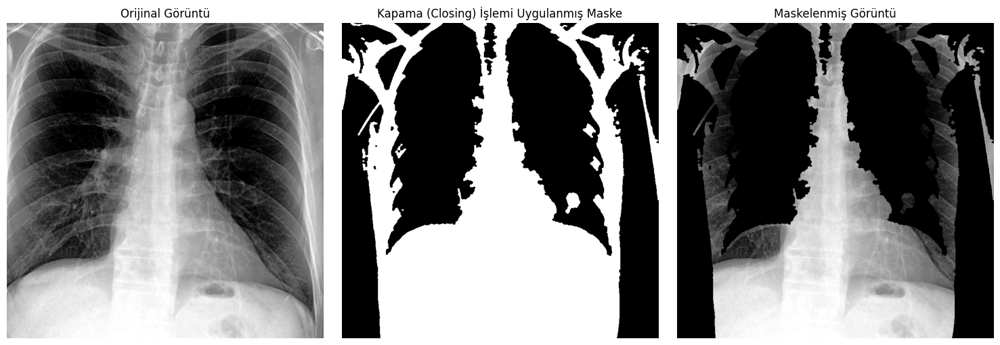

In [ ]:
# Maske ile Orijinal Görüntüyü Çarpma

import numpy as np
import matplotlib.pyplot as plt

# Maske ile orijinal görüntüyü çarp
masked_image = img * (closed_mask > 0)  # Maskenin beyaz olduğu bölgeleri orijinal görüntüyle çarp

# Sonuçları görselleştirme
plt.figure(figsize=(15, 5))

# Orijinal Görüntü
plt.subplot(1, 3, 1)
plt.imshow(img, cmap='gray')
plt.title('Orijinal Görüntü')
plt.axis('off')

# Maske
plt.subplot(1, 3, 2)
plt.imshow(closed_mask, cmap='gray')
plt.title('Kapama (Closing) İşlemi Uygulanmış Maske')
plt.axis('off')

# Maskelenmiş Görüntü
plt.subplot(1, 3, 3)
plt.imshow(masked_image, cmap='gray')
plt.title('Maskelenmiş Görüntü')
plt.axis('off')

plt.tight_layout()
plt.show()

Maske ile Orijinal Görüntüyü Çarpma: closed_mask > 0: Maskenin beyaz olduğu bölgeleri seçer (akciğer bölgeleri).

img * (closed_mask > 0): Orijinal görüntüyü, maskenin beyaz olduğu bölgelerle çarpar. Bu, akciğer bölgelerini orijinal görüntüde vurgular.

Görselleştirme: Orijinal Görüntü: İşlem öncesi orijinal görüntü.
Kapama (Closing) İşlemi Uygulanmış Maske: Morfolojik işlemlerden geçirilmiş binary maske.

Maskelenmiş Görüntü: Orijinal görüntünün, maskenin beyaz olduğu bölgelerle çarpılmış hali.

Sonuçlar ve Yorum Orijinal Görüntü: İşlem öncesi orijinal görüntü, akciğer bölgesi ve diğer yapıları içerir.

Kapama (Closing) İşlemi Uygulanmış Maske: Binary maske, akciğer bölgesini beyaz, diğer bölgeleri siyah olarak gösterir. Morfolojik işlemler (açma ve kapama) uygulanarak, küçük gürültüler ve delikler temizlenmiştir.

Maskelenmiş Görüntü: Orijinal görüntüde sadece akciğer bölgesi vurgulanmıştır. Diğer bölgeler siyah olarak gösterilir, böylece akciğer bölgesi net bir şekilde öne çıkar.

Maske ile Çarpma İşlemi:

Bu işlem, akciğer bölgesini orijinal görüntüde vurgular. Diğer bölgeler siyah olarak gösterilir, böylece akciğer bölgesi net bir şekilde öne çıkar.

Morfolojik İşlemlerin Etkisi:

Açma (Opening) ve Kapama (Closing) işlemleri, maskenin kalitesini artırarak daha temiz bir sonuç elde edilmesini sağlar. Bu işlemler, küçük gürültüleri ve delikleri temizler.

Sonuç:

Maskelenmiş görüntü, akciğer bölgesini net bir şekilde gösterir.
Bu görüntü, sonraki adımlarda (örneğin, segmentasyon veya nesne tespiti) kullanılabilir.

Maske ile orijinal görüntüyü çarpma, akciğer bölgesini vurgulamak için etkili bir yöntemdir. Bu işlem, görüntü işleme sürecinin sonuçlarını net bir şekilde gösterir. Elde edilen maskelenmiş görüntü, sonraki analizler için kullanılabilir.

Görselleştirme Çıktısı: Orijinal Görüntü: İşlem öncesi orijinal görüntü.

Kapama (Closing) İşlemi Uygulanmış Maske: Morfolojik işlemlerden geçirilmiş binary maske.

Maskelenmiş Görüntü: Orijinal görüntünün, maskenin beyaz olduğu bölgelerle çarpılmış hali.

Bu görselleştirme, görüntü işleme sonuçlarını net bir şekilde göstermektedir.
